#Problem Statement

Recruiting and retaining drivers is seen by industry watchers as a tough battle for Ola. Churn among drivers is high and it’s very easy for drivers to stop working for the service on the fly or jump to Uber depending on the rates.

As the companies get bigger, the high churn could become a bigger problem. To find new drivers, Ola is casting a wide net, including people who don’t have cars for jobs. But this acquisition is really costly. Losing drivers frequently impacts the morale of the organization and acquiring new drivers is more expensive than retaining existing ones.

**You are working as a data scientist with the Analytics Department of Ola, focused on driver team attrition. You are provided with the monthly information for a segment of drivers for 2019 and 2020 and tasked to predict whether a driver will be leaving the company or not** based on their attributes like Demographics (city, age, gender etc.)
Tenure information (joining date, Last Date)
Historical data regarding the performance of the driver (Quarterly rating, Monthly business acquired, grade, Income)

#Loading the dataset

In [ ]:
import pandas as pd
import numpy  as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
!gdown https://d2beiqkhq929f0.cloudfront.net/public_assets/assets/000/002/492/original/ola_driver_scaler.csv

Downloading...
From: https://d2beiqkhq929f0.cloudfront.net/public_assets/assets/000/002/492/original/ola_driver_scaler.csv
To: /content/ola_driver_scaler.csv
100% 1.13M/1.13M [00:00<00:00, 15.5MB/s]


In [ ]:
df = pd.read_csv("https://d2beiqkhq929f0.cloudfront.net/public_assets/assets/000/002/492/original/ola_driver_scaler.csv")
df.head(2)

,Unnamed: 0,MMM-YY,Driver_ID,Age,Gender,City,Education_Level,Income,Dateofjoining,LastWorkingDate,Joining Designation,Grade,Total Business Value,Quarterly Rating
0,0,01/01/19,1,28.0,0.0,C23,2,57387,24/12/18,NaN,1,1,2381060,2
1,1,02/01/19,1,28.0,0.0,C23,2,57387,24/12/18,NaN,1,1,-665480,2


***Column Profiling:***

MMMM-YY : Reporting Date (Monthly)

Driver_ID : Unique id for drivers

Age : Age of the driver

Gender : Gender of the driver – Male : 0, Female: 1

City : City Code of the driver

Education_Level : Education level – 0 for 10+ ,1 for 12+ ,2 for graduate

Income : Monthly average Income of the driver

Date Of Joining : Joining date for the driver

LastWorkingDate : Last date of working for the driver

Joining Designation : Designation of the driver at the time of joining

Grade : Grade of the driver at the time of reporting

Total Business Value : The total business value acquired by the driver in a month (negative business indicates cancellation/refund or car EMI adjustments)

Quarterly Rating : Quarterly rating of the driver: 1,2,3,4,5 (higher is better)

#Data Quality Checks

In [ ]:
print('Number of Columns :', df.shape[0])
print('Number of Rows :', df.shape[1])

Number of Columns : 19104
Number of Rows : 14


In [ ]:
df.columns

Index(['Unnamed: 0', 'MMM-YY', 'Driver_ID', 'Age', 'Gender', 'City',
       'Education_Level', 'Income', 'Dateofjoining', 'LastWorkingDate',
       'Joining Designation', 'Grade', 'Total Business Value',
       'Quarterly Rating'],
      dtype='object')

In [ ]:
df['Unnamed: 0'].head(10)

0    0
1    1
2    2
3    3
4    4
5    5
6    6
7    7
8    8
9    9
Name: Unnamed: 0, dtype: int64

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19104 entries, 0 to 19103
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Unnamed: 0            19104 non-null  int64  
 1   MMM-YY                19104 non-null  object 
 2   Driver_ID             19104 non-null  int64  
 3   Age                   19043 non-null  float64
 4   Gender                19052 non-null  float64
 5   City                  19104 non-null  object 
 6   Education_Level       19104 non-null  int64  
 7   Income                19104 non-null  int64  
 8   Dateofjoining         19104 non-null  object 
 9   LastWorkingDate       1616 non-null   object 
 10  Joining Designation   19104 non-null  int64  
 11  Grade                 19104 non-null  int64  
 12  Total Business Value  19104 non-null  int64  
 13  Quarterly Rating      19104 non-null  int64  
dtypes: float64(2), int64(8), object(4)
memory usage: 2.0+ MB


In [ ]:
df.dtypes

Unnamed: 0                int64
MMM-YY                   object
Driver_ID                 int64
Age                     float64
Gender                  float64
City                     object
Education_Level           int64
Income                    int64
Dateofjoining            object
LastWorkingDate          object
Joining Designation       int64
Grade                     int64
Total Business Value      int64
Quarterly Rating          int64
dtype: object

In [ ]:
df.describe(include = 'all')

,Unnamed: 0,MMM-YY,Driver_ID,Age,Gender,City,Education_Level,Income,Dateofjoining,LastWorkingDate,Joining Designation,Grade,Total Business Value,Quarterly Rating
count,19104.000000,19104,19104.000000,19043.000000,19052.000000,19104,19104.000000,19104.000000,19104,1616,19104.000000,19104.000000,1.910400e+04,19104.000000
unique,NaN,24,NaN,NaN,NaN,29,NaN,NaN,869,493,NaN,NaN,NaN,NaN
top,NaN,01/01/19,NaN,NaN,NaN,C20,NaN,NaN,23/07/15,29/07/20,NaN,NaN,NaN,NaN
freq,NaN,1022,NaN,NaN,NaN,1008,NaN,NaN,192,70,NaN,NaN,NaN,NaN
mean,9551.500000,NaN,1415.591133,34.668435,0.418749,NaN,1.021671,65652.025126,NaN,NaN,1.690536,2.252670,5.716621e+05,2.008899
std,5514.994107,NaN,810.705321,6.257912,0.493367,NaN,0.800167,30914.515344,NaN,NaN,0.836984,1.026512,1.128312e+06,1.009832
min,0.000000,NaN,1.000000,21.000000,0.000000,NaN,0.000000,10747.000000,NaN,NaN,1.000000,1.000000,-6.000000e+06,1.000000
25%,4775.750000,NaN,710.000000,30.000000,0.000000,NaN,0.000000,42383.000000,NaN,NaN,1.000000,1.000000,0.000000e+00,1.000000
50%,9551.500000,NaN,1417.000000,34.000000,0.000000,NaN,1.000000,60087.000000,NaN,NaN,1.000000,2.000000,2.500000e+05,2.000000
75%,14327.250000,NaN,2137.000000,39.000000,1.000000,NaN,2.000000,83969.000000,NaN,NaN,2.000000,3.000000,6.997000e+05,3.000000


Based on the resluts above the follwibg are inferences that can be made

Here **'Unnamed: 0'** dioesn't seem relevant therefore we can drop thhe column.

Age & Gender should be integer values inplace of float

Attributes with Dates must be in datetime format

Somme basic renaming can also be dne for the ace of better understanding setups

In [ ]:
df.drop(columns = ['Unnamed: 0'], inplace = True)
df.head()

,MMM-YY,Driver_ID,Age,Gender,City,Education_Level,Income,Dateofjoining,LastWorkingDate,Joining Designation,Grade,Total Business Value,Quarterly Rating
0,01/01/19,1,28.0,0.0,C23,2,57387,24/12/18,NaN,1,1,2381060,2
1,02/01/19,1,28.0,0.0,C23,2,57387,24/12/18,NaN,1,1,-665480,2
2,03/01/19,1,28.0,0.0,C23,2,57387,24/12/18,03/11/19,1,1,0,2
3,11/01/20,2,31.0,0.0,C7,2,67016,11/06/20,NaN,2,2,0,1
4,12/01/20,2,31.0,0.0,C7,2,67016,11/06/20,NaN,2,2,0,1


In [ ]:
df['LastWorkingDate'].fillna(value=0, inplace=True)
df.loc[df['LastWorkingDate'] != 0, 'LastWorkingDate'] = 1

In [ ]:
df['LastWorkingDate'].value_counts()

0    17488
1     1616
Name: LastWorkingDate, dtype: int64

In [ ]:
df.rename(columns = {'MMM-YY' : 'reporting_date'}, inplace = True)
df.rename(columns = {'Dateofjoining' : 'joining_date'}, inplace = True)

In [ ]:
df.columns

Index(['reporting_date', 'Driver_ID', 'Age', 'Gender', 'City',
       'Education_Level', 'Income', 'joining_date', 'LastWorkingDate',
       'Joining Designation', 'Grade', 'Total Business Value',
       'Quarterly Rating'],
      dtype='object')

In [ ]:
pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
  Preparing metadata (setup.py) ... done


In [ ]:
from pandas_profiling import ProfileReport
profile = ProfileReport(df, title='Pandas Profiling Report',
                        html={'style': {'full_width': True}},
                        explorative=True)
profile.to_file("report.html")
profile.to_widgets()  ### Herein we can togle between the taabs to haave aa look into the data profile reports & infer the details.

<ipython-input-16-b46bed3eebbd>:1: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/ydata_profiling/profile_report.py:507: UserWarning: Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60).As an alternative, you can use the HTML report. See the documentation for more information.
  warnings.warn(


Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

#Out comes of analysis above
Income is highly overall correlated with Grade

Joining Designation is highly overall correlated with Grade

Grade is highly overall correlated with Income and 1 other fields

LastWorkingDate has 17488 (91.5%) missing values

Total Business Value has 6499 (34.0%) zero

##Check for mIssing Values

In [ ]:
df.isnull().sum()/len(df)*100

reporting_date          0.000000
Driver_ID               0.000000
Age                     0.319305
Gender                  0.272194
City                    0.000000
Education_Level         0.000000
Income                  0.000000
joining_date            0.000000
LastWorkingDate         0.000000
Joining Designation     0.000000
Grade                   0.000000
Total Business Value    0.000000
Quarterly Rating        0.000000
dtype: float64

Sinnce the other two columns Age & Gender are numerical, Therefore we can try with KNN imputer for null value imputation.

In [ ]:
from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors = 4)

##impute missing values in the DataFrame
imputer = KNNImputer(n_neighbors = 4)
df['Age'] = imputer.fit_transform(df[['Age']])
df['Gender'] = imputer.fit_transform(df[['Gender']])

In [ ]:
df.isnull().sum()/len(df)*100

reporting_date          0.0
Driver_ID               0.0
Age                     0.0
Gender                  0.0
City                    0.0
Education_Level         0.0
Income                  0.0
joining_date            0.0
LastWorkingDate         0.0
Joining Designation     0.0
Grade                   0.0
Total Business Value    0.0
Quarterly Rating        0.0
dtype: float64

##Converting the attributes to the relevent datatypes, fitting the business case & data entry type itself.

In [ ]:
df['reporting_date'] = pd.to_datetime(df['reporting_date'])
df['joining_date'] = pd.to_datetime(df['joining_date'])

In [ ]:
df['Age'] = df['Age'].astype(int)
df['Gender'] = df['Gender'].astype(int)
df['LastWorkingDate'] = df['Gender'].astype(int)

In [ ]:
df.dtypes

reporting_date          datetime64[ns]
Driver_ID                        int64
Age                              int64
Gender                           int64
City                            object
Education_Level                  int64
Income                           int64
joining_date            datetime64[ns]
LastWorkingDate                  int64
Joining Designation              int64
Grade                            int64
Total Business Value             int64
Quarterly Rating                 int64
dtype: object

C20    1008
C29     900
C26     869
C22     809
C27     786
C15     761
C10     744
C12     727
C8      712
C16     709
C28     683
C1      677
C6      660
C5      656
C14     648
C3      637
C24     614
C7      609
C21     603
C25     584
C19     579
C4      578
C13     569
C18     544
C23     538
C9      520
C2      472
C11     468
C17     440
Name: City, dtype: int64
29


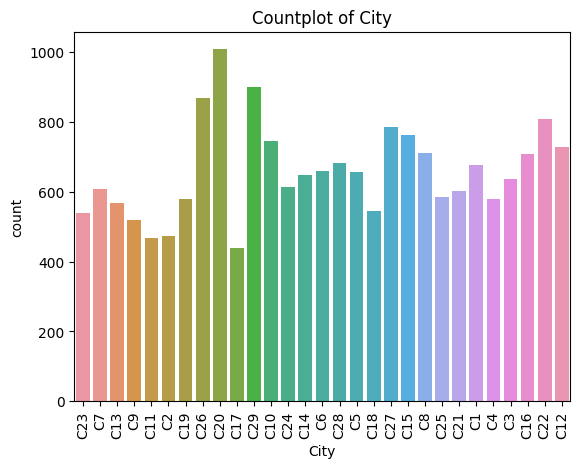

12    1008
21     900
18     869
14     809
19     786
6      761
1      744
3      727
27     712
7      709
20     683
0      677
25     660
24     656
5      648
22     637
16     614
26     609
13     603
17     584
10     579
23     578
4      569
9      544
15     538
28     520
11     472
2      468
8      440
Name: City, dtype: int64


In [ ]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
print(df['City'].value_counts()), print(df['City'].nunique())

sns.countplot(data=df, x=df['City'])
plt.title('Countplot of City')
plt.xticks(rotation=90)
plt.show()

le = LabelEncoder()
df['City'] = le.fit_transform(df['City'])
print(df['City'].value_counts())

In [ ]:
for column in df.columns:
    print(column, ':' , df[column].nunique(), df[column].dtypes)

reporting_date : 24 datetime64[ns]
Driver_ID : 2381 int64
Age : 36 int64
Gender : 2 int64
City : 29 int64
Education_Level : 3 int64
Income : 2383 int64
joining_date : 869 datetime64[ns]
LastWorkingDate : 2 int64
Joining Designation : 5 int64
Grade : 5 int64
Total Business Value : 10181 int64
Quarterly Rating : 4 int64


# Removal of Duplicated values

In [ ]:
df1 = df[df.duplicated()]
print(df.shape)
df1.drop_duplicates(inplace=True)

(19104, 13)


,reporting_date,Driver_ID,Age,Gender,City,Education_Level,Income,joining_date,LastWorkingDate,Joining Designation,Grade,Total Business Value,Quarterly Rating


2019-01-01    1022
2019-02-01     944
2019-03-01     870
2020-12-01     819
2020-10-01     818
2020-08-01     812
2020-09-01     809
2020-07-01     806
2020-11-01     805
2019-12-01     795
2019-04-01     794
2020-01-01     782
2019-11-01     781
2020-06-01     770
2020-05-01     766
2019-05-01     764
2019-09-01     762
2020-02-01     761
2019-07-01     757
2019-08-01     754
2019-10-01     739
2020-04-01     729
2019-06-01     726
2020-03-01     719
Name: reporting_date, dtype: int64
2110    24
2617    24
1623    24
1642    24
1644    24
        ..
1614     1
445      1
2397     1
1619     1
469      1
Name: Driver_ID, Length: 2381, dtype: int64


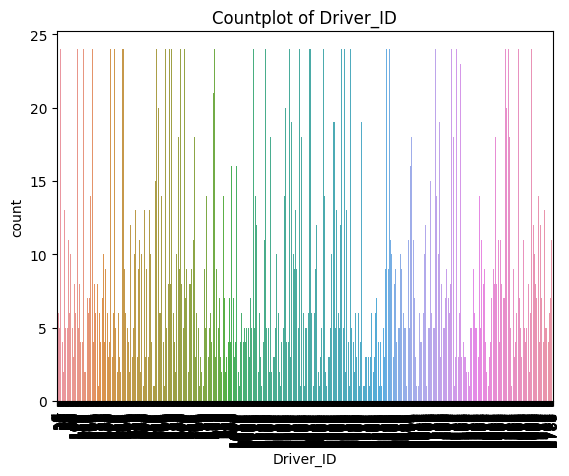

34    1295
36    1283
33    1250
30    1146
32    1143
35    1138
31    1076
29    1013
37     862
38     854
39     788
28     772
27     744
40     701
41     661
26     566
42     478
25     449
44     407
43     399
45     371
46     350
24     274
47     224
23     193
48     144
49      99
22      92
52      78
51      72
50      69
21      35
53      26
54      24
55      21
58       7
Name: Age, dtype: int64


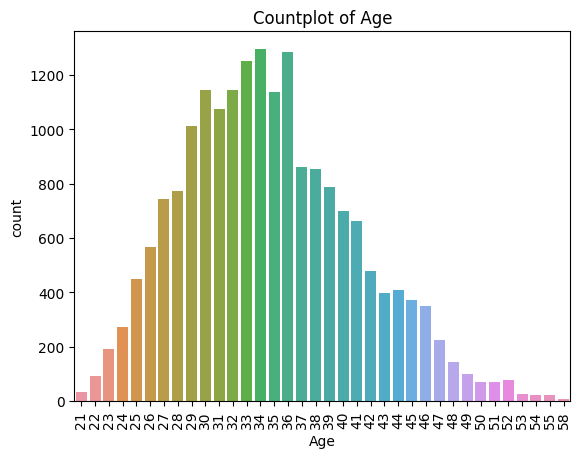

0    11126
1     7978
Name: Gender, dtype: int64


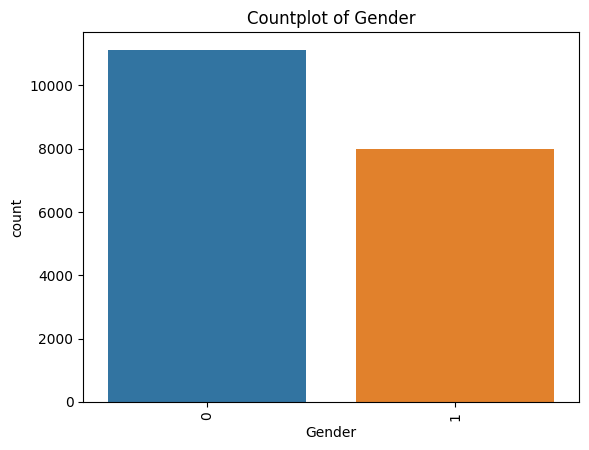

12    1008
21     900
18     869
14     809
19     786
6      761
1      744
3      727
27     712
7      709
20     683
0      677
25     660
24     656
5      648
22     637
16     614
26     609
13     603
17     584
10     579
23     578
4      569
9      544
15     538
28     520
11     472
2      468
8      440
Name: City, dtype: int64


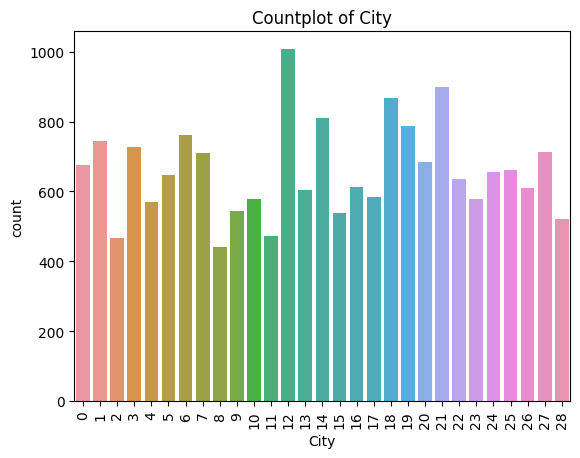

1    6864
2    6327
0    5913
Name: Education_Level, dtype: int64


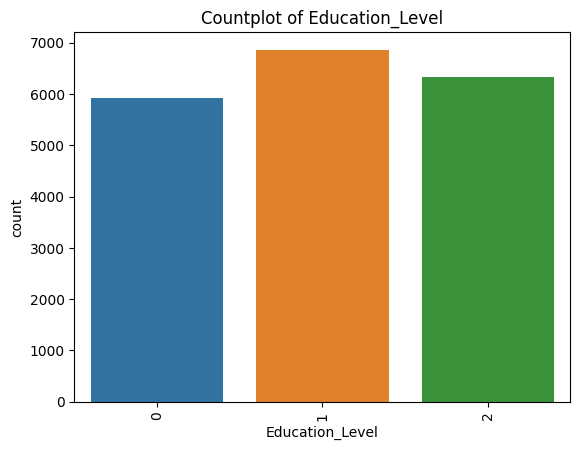

48747     57
109652    32
68356     30
42260     28
67490     28
          ..
44706      1
72186      1
67162      1
22132      1
35091      1
Name: Income, Length: 2383, dtype: int64


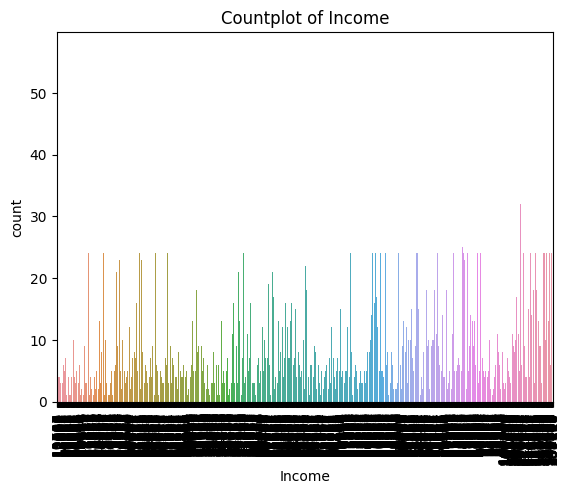

2015-07-23    192
2020-07-31    150
2019-07-04    146
2016-04-25    134
2015-07-30    118
             ... 
2018-03-16      1
2018-09-26      1
2020-12-27      1
2018-12-29      1
2018-12-16      1
Name: joining_date, Length: 869, dtype: int64
0    11126
1     7978
Name: LastWorkingDate, dtype: int64


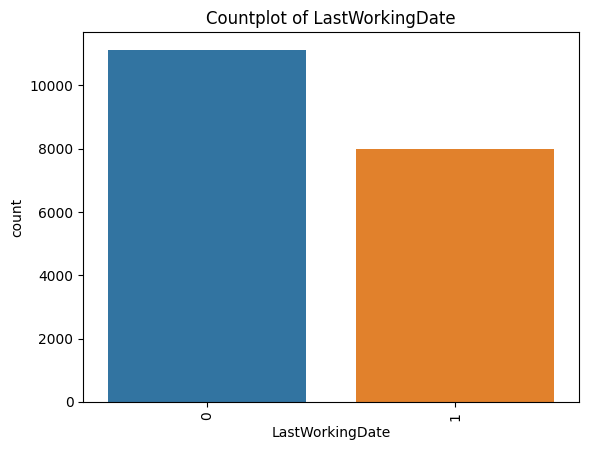

1    9831
2    5955
3    2847
4     341
5     130
Name: Joining Designation, dtype: int64


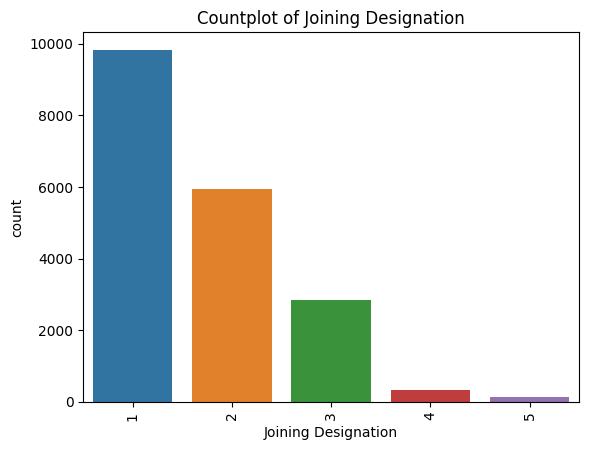

2    6627
1    5202
3    4826
4    2144
5     305
Name: Grade, dtype: int64


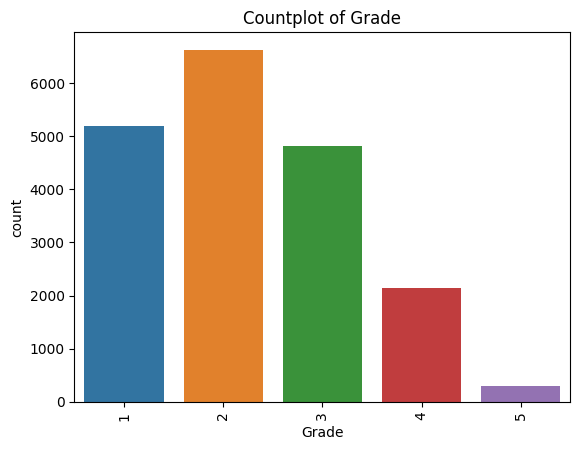

0         6499
200000     288
250000     148
500000     131
300000     107
          ... 
130520       1
275330       1
820160       1
203040       1
448370       1
Name: Total Business Value, Length: 10181, dtype: int64


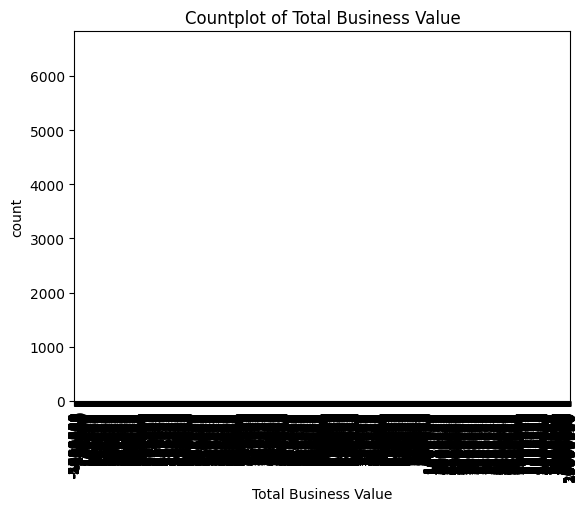

1    7679
2    5553
3    3895
4    1977
Name: Quarterly Rating, dtype: int64


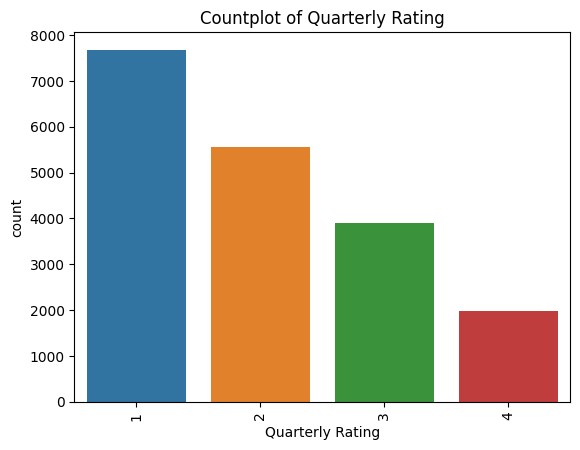

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

for column in df.columns:
    print(df[column].value_counts())

    # Checking if the column contains numerical data (int or float)
    if df[column].dtype in [int, float]:
        sns.countplot(data=df, x=column)
        plt.title('Countplot of ' + column)
        plt.xticks(rotation=90)
        plt.show()

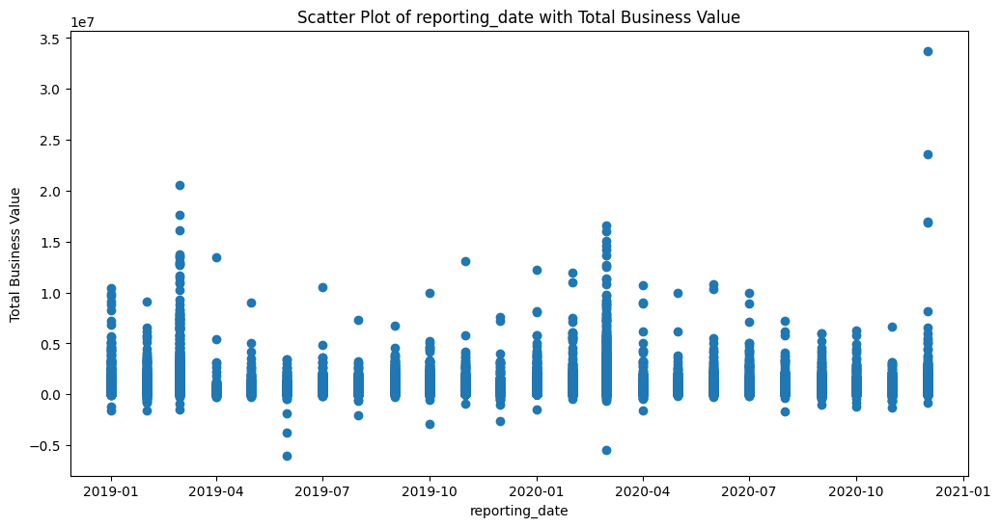

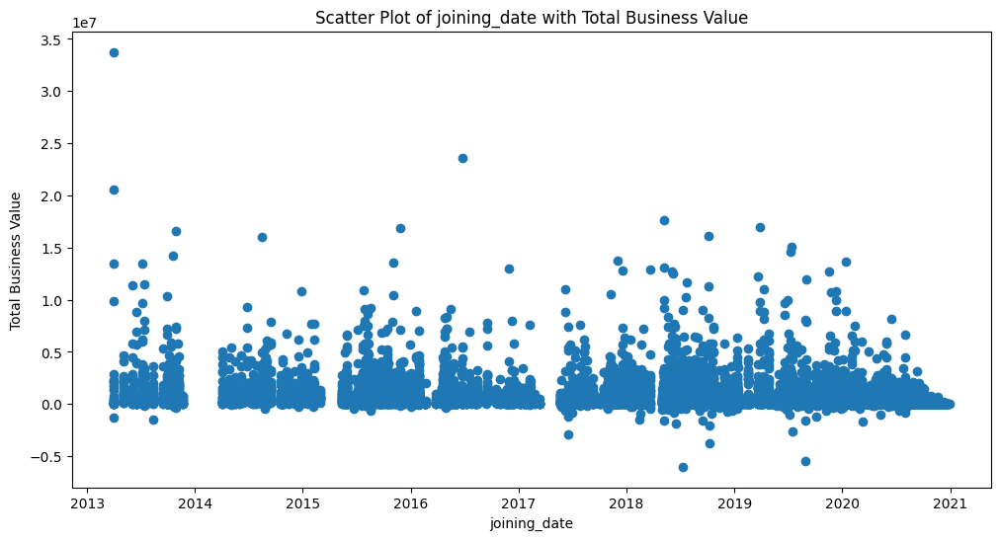

In [ ]:
if 'Total Business Value' in df.columns:
    for column in df.columns:
        if df[column].dtype == 'datetime64[ns]':
            plt.figure(figsize=(12, 6))
            plt.scatter(df[column], df['Total Business Value'])
            plt.title(f'Scatter Plot of {column} with Total Business Value')
            plt.xlabel(column)
            plt.ylabel('Total Business Value')
            plt.show()
else:
    print("'Total Business Value' column not found in the DataFrame.")

In [ ]:
df['Quarter'] = df['reporting_date'].dt.to_period('Q')
A = df.groupby(['Quarter', 'Gender']).agg({'Total Business Value': 'mean'}).round(2).reset_index()
A

,Quarter,Gender,Total Business Value
0,2019Q1,0,900091.72
1,2019Q1,1,914025.85
2,2019Q2,0,264569.14
3,2019Q2,1,281047.24
4,2019Q3,0,458857.57
5,2019Q3,1,438602.25
6,2019Q4,0,410541.48
7,2019Q4,1,440535.53
8,2020Q1,0,1025195.33
9,2020Q1,1,1085282.50


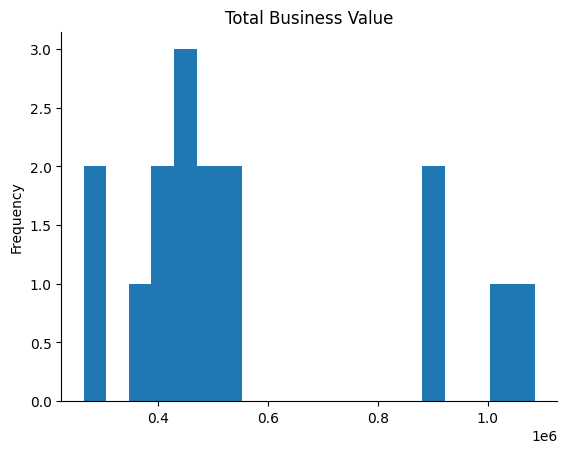

In [ ]:
from matplotlib import pyplot as plt
A['Total Business Value'].plot(kind='hist', bins=20, title='Total Business Value')
plt.gca().spines[['top', 'right',]].set_visible(False)

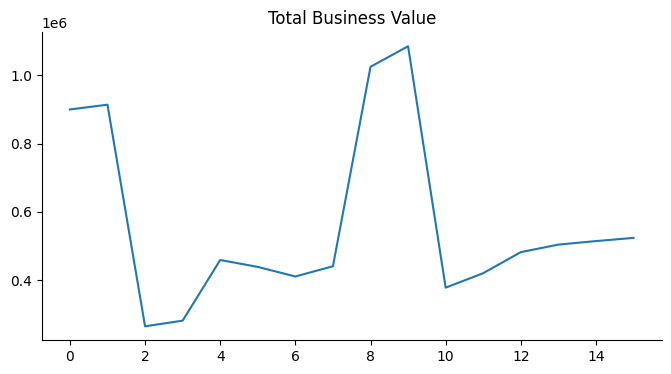

In [ ]:
from matplotlib import pyplot as plt
A['Total Business Value'].plot(kind='line', figsize=(8, 4), title='Total Business Value')
plt.gca().spines[['top', 'right']].set_visible(False)

In [ ]:
# Convert 'Total Business Value' to numeric and handle missing values
df['Total Business Value'] = pd.to_numeric(df['Total Business Value'], errors='coerce')
df['Year'] = df['reporting_date'].dt.to_period('Y')
A = df.groupby(['Year', 'Gender']).agg({'Total Business Value': 'mean'}).round(2).reset_index()
A

,Year,Gender,Total Business Value
0,2019,0,528750.81
1,2019,1,543258.01
2,2020,0,597801.30
3,2020,1,626357.33


In [ ]:
A = df.groupby(['Quarter', 'City']).agg({'Total Business Value': 'mean'}).round(2).reset_index()
A

,Quarter,City,Total Business Value
0,2019Q1,0,946746.00
1,2019Q1,1,855056.10
2,2019Q1,2,922839.04
3,2019Q1,3,849363.20
4,2019Q1,4,1151875.24
...,...,...,...
227,2020Q4,24,615457.78
228,2020Q4,25,555514.20
229,2020Q4,26,618514.58
230,2020Q4,27,485281.32


In [ ]:
A = df.groupby(['Year', 'City']).agg({'Total Business Value': 'mean'}).round(2).reset_index()
A

,Year,City,Total Business Value
0,2019,0,535451.04
1,2019,1,483389.06
2,2019,2,520078.88
3,2019,3,552495.34
4,2019,4,739826.45
5,2019,5,614630.68
6,2019,6,496215.27
7,2019,7,579376.13
8,2019,8,440684.15
9,2019,9,574254.07


In [ ]:
A = df.groupby(['Joining Designation', 'Grade']).agg({'Total Business Value': 'mean'}).round(2).reset_index()
A

,Joining Designation,Grade,Total Business Value
0,1,1,356496.48
1,1,2,698824.69
2,1,3,957190.24
3,1,4,1466806.56
4,1,5,1699449.84
5,2,2,331035.54
6,2,3,857433.34
7,2,4,1179416.42
8,2,5,2671441.72
9,3,3,343352.84


In [ ]:
A = df.groupby(['Gender']).agg({'Total Business Value': 'mean'}).round(2).reset_index()
A

,Gender,Total Business Value
0,0,562661.63
1,1,584213.95


In [ ]:
A = df.groupby(['City', 'LastWorkingDate']).agg({'Total Business Value': 'mean'}).round(2).reset_index()
A

,City,LastWorkingDate,Total Business Value
0,0,0,529741.64
1,0,1,533929.46
2,1,0,530020.17
3,1,1,558439.29
4,2,0,419894.62
5,2,1,644713.72
6,3,0,723929.13
7,3,1,561794.33
8,4,0,589868.23
9,4,1,1204730.37


In [ ]:
A = df.groupby(['Education_Level', 'Income']).agg({'Total Business Value': 'mean'}).round(2).reset_index()
A

,Education_Level,Income,Total Business Value
0,0,10747,0.00
1,0,10883,0.00
2,0,11068,181478.12
3,0,11236,0.00
4,0,11706,114092.00
...,...,...,...
2410,2,153766,0.00
2411,2,157124,977959.58
2412,2,167758,0.00
2413,2,169549,2000738.33


In [ ]:
A = df.groupby(['Education_Level']).agg({'Total Business Value': 'mean'}).round(2).reset_index()
A

,Education_Level,Total Business Value
0,0,565410.66
1,1,601287.87
2,2,545364.18


In [ ]:
A = df.groupby(['Driver_ID', 'Income']).agg({'Total Business Value': 'mean'}).round(2).reset_index()
A = A.sort_values(by='Total Business Value', ascending=False)
A

,Driver_ID,Income,Total Business Value
2193,2522,90057,3972127.50
1421,1638,122837,3759614.38
18,26,121529,3689321.43
1920,2210,112513,3159657.14
1630,1877,116992,3089774.12
...,...,...,...
809,930,37285,-101180.00
50,61,19818,-146433.33
755,868,34497,-161287.50
1521,1754,42975,-166666.67


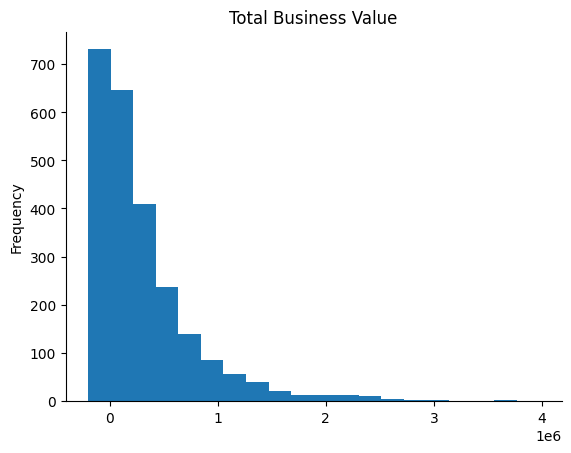

In [ ]:
from matplotlib import pyplot as plt
A['Total Business Value'].plot(kind='hist', bins=20, title='Total Business Value')
plt.gca().spines[['top', 'right',]].set_visible(False)

In [ ]:
A = df.groupby(['Education_Level', 'Income']).agg({'Total Business Value': 'mean'}).round(2).reset_index()
A = A.sort_values(by='Total Business Value', ascending=False)
A

,Education_Level,Income,Total Business Value
1483,1,90057,3972127.50
1581,1,122837,3759614.38
2371,2,121529,3689321.43
1558,1,112513,3159657.14
773,0,116992,3089774.12
...,...,...,...
1735,2,37285,-101180.00
1608,2,19818,-146433.33
217,0,34497,-161287.50
1802,2,42975,-166666.67


In [ ]:
A = df.groupby(['Driver_ID']).agg({'Quarterly Rating': ['min', 'max']}).round(2).reset_index()
A.columns = ['Driver_ID', 'Min Quarterly Rating', 'Max Quarterly Rating']
A

,Driver_ID,Min Quarterly Rating,Max Quarterly Rating
0,1,2,2
1,2,1,1
2,4,1,1
3,5,1,1
4,6,1,2
...,...,...,...
2376,2784,1,4
2377,2785,1,1
2378,2786,1,2
2379,2787,1,2


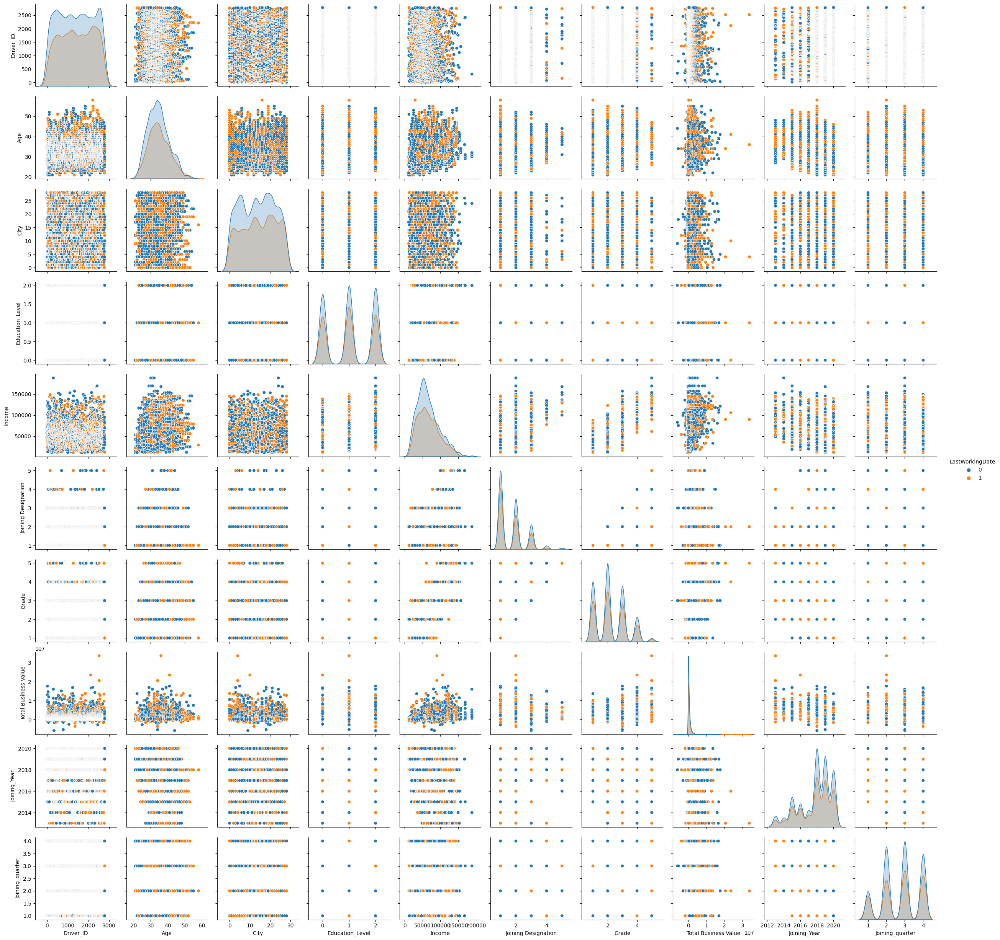

In [ ]:
sns.pairplot(df, hue = 'LastWorkingDate')
plt.show()

## Feature Engineering

<ipython-input-44-7c9a280697a5>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(method='spearman'), annot=True, cmap='viridis')


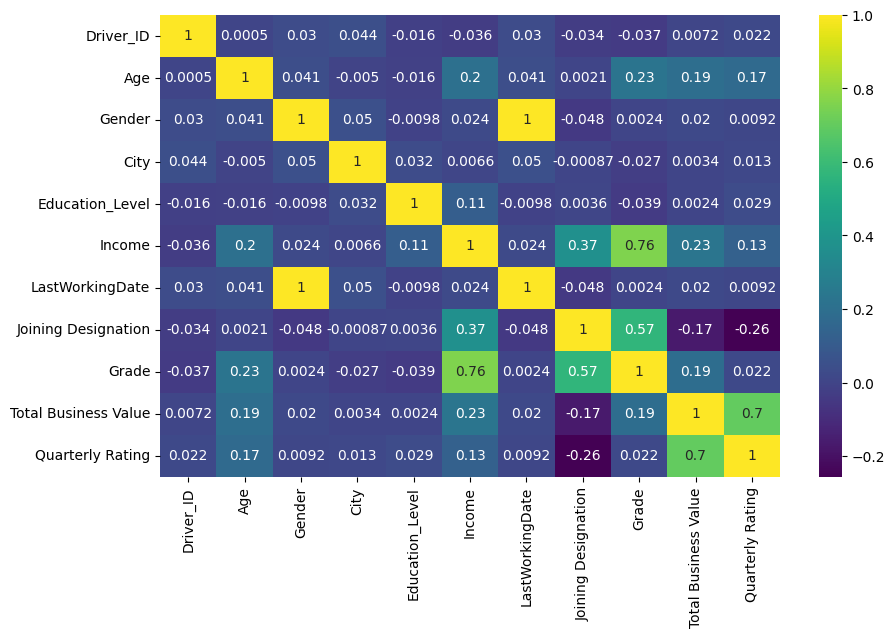

In [ ]:
plt.figure(figsize=(10, 6))
sns.heatmap(df.corr(method='spearman'), annot=True, cmap='viridis')
plt.show()

Herein we can see that Gender & last working are highly correlated to each other. Also, Gender is very weekaly correlated to other features as well. Therefore we can drop Gender column.

In [ ]:
df.drop(columns = ['Gender'], inplace = True)
df.columns

Index(['reporting_date', 'Driver_ID', 'Age', 'City', 'Education_Level',
       'Income', 'joining_date', 'LastWorkingDate', 'Joining Designation',
       'Grade', 'Total Business Value', 'Quarterly Rating', 'Quarter', 'Year'],
      dtype='object')

In [ ]:
df['Reporting_Year'] = df['reporting_date'].dt.year
df['Reporting_quarter'] = df['reporting_date'].dt.quarter
df['Joining_Year'] = df['joining_date'].dt.year
df['Joining_quarter'] = df['joining_date'].dt.quarter

In [ ]:
df.drop(columns = ['reporting_date', 'joining_date', 'Quarter', 'Year'], inplace = True)
df.columns

Index(['Driver_ID', 'Age', 'City', 'Education_Level', 'Income',
       'LastWorkingDate', 'Joining Designation', 'Grade',
       'Total Business Value', 'Quarterly Rating', 'Reporting_Year',
       'Reporting_quarter', 'Joining_Year', 'Joining_quarter'],
      dtype='object')

In [ ]:
df.isnull().sum()

Driver_ID               0
Age                     0
City                    0
Education_Level         0
Income                  0
LastWorkingDate         0
Joining Designation     0
Grade                   0
Total Business Value    0
Quarterly Rating        0
Reporting_Year          0
Reporting_quarter       0
Joining_Year            0
Joining_quarter         0
dtype: int64

In [ ]:
df.dtypes

Driver_ID               int64
Age                     int64
City                    int64
Education_Level         int64
Income                  int64
LastWorkingDate         int64
Joining Designation     int64
Grade                   int64
Total Business Value    int64
Quarterly Rating        int64
Reporting_Year          int64
Reporting_quarter       int64
Joining_Year            int64
Joining_quarter         int64
dtype: object

#Feature importance check using Random Forest

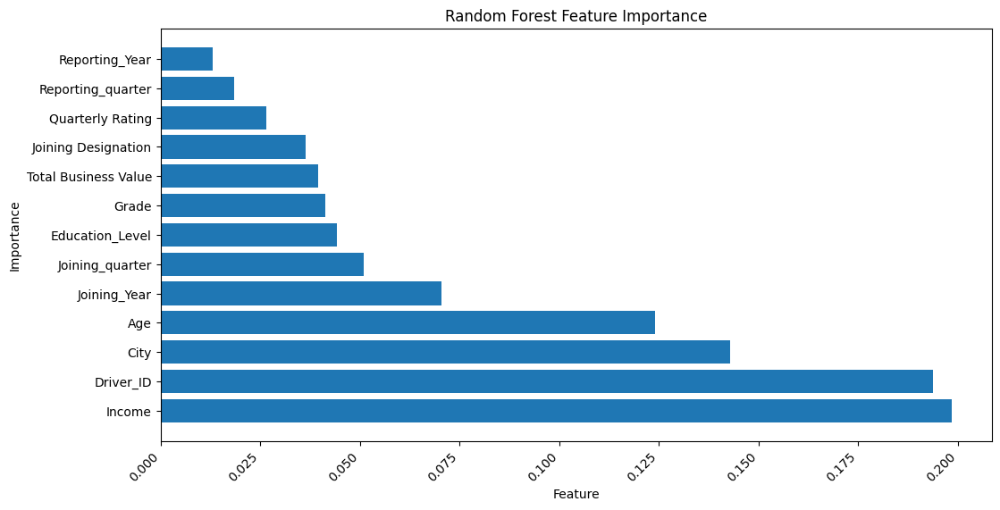

In [ ]:
# Import necessary libraries
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
import matplotlib.pyplot as plt

X = df.drop('LastWorkingDate', axis=1)
y = df['LastWorkingDate']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)
rf_classifier.fit(X_train, y_train)

feature_importances = rf_classifier.feature_importances_

feature_importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': feature_importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)


# Plot the feature importances
plt.figure(figsize=(12, 6))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'])
plt.xlabel('Feature')
plt.ylabel('Importance')
plt.title('Random Forest Feature Importance')
plt.xticks(rotation=45, ha='right')
plt.show()

Based on the above date repressentation we can choose to remove the last three columns herein.

In [ ]:
df.drop(columns = ['Reporting_Year', 'Reporting_quarter', 'Quarterly Rating'], inplace = True)
df.columns

Index(['Driver_ID', 'Age', 'City', 'Education_Level', 'Income',
       'LastWorkingDate', 'Joining Designation', 'Grade',
       'Total Business Value', 'Joining_Year', 'Joining_quarter'],
      dtype='object')

In [56]:
from sklearn.ensemble import AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

X = df[['Driver_ID', 'Age', 'City', 'Education_Level', 'Income',
        'Joining Designation', 'Grade',
        'Total Business Value', 'Joining_Year', 'Joining_quarter']]
y = df['LastWorkingDate']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

base_model = DecisionTreeRegressor(max_depth=1)
adaboost_regressor = AdaBoostRegressor(base_model, n_estimators=50, random_state=42)
adaboost_regressor.fit(X_train, y_train)

predictions = adaboost_regressor.predict(X_test)

mse = mean_squared_error(y_test, predictions)
print(f'AdaBoost Regression MSE: {mse}')

AdaBoost Regression MSE: 0.24203321877546147


In [57]:
from sklearn.metrics import r2_score, mean_absolute_error

r2 = r2_score(y_test, predictions)  # Evaluate the model using R-squared and Mean Absolute Error (MAE)
mae = mean_absolute_error(y_test, predictions)

print(f'R-squared: {r2}')
print(f'Mean Absolute Error: {mae}')

R-squared: 0.006632881355271181
Mean Absolute Error: 0.48225699360075946


In [58]:
from sklearn.model_selection import GridSearchCV


param_grid = {
    'n_estimators': [50, 100, 150],
    'base_estimator__max_depth': [1, 2, 3],
}    # Define the parameter grid for hyperparameter tuning

base_model = DecisionTreeRegressor()
adaboost_regressor = AdaBoostRegressor(base_model, random_state=42)

grid_search = GridSearchCV(adaboost_regressor, param_grid, cv=3, scoring='neg_mean_squared_error')
grid_search.fit(X_train, y_train)


best_params = grid_search.best_params_
print(f'Best Hyperparameters: {best_params}')

best_model = grid_search.best_estimator_
best_predictions = best_model.predict(X_test)

best_mse = mean_squared_error(y_test, best_predictions) # Evaluate the best model
print(f'Best Model MSE: {best_mse}')

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:674: FutureWarning: Parameter 'base_estimator' of AdaBoostRegressor is deprecated in favor of 'estimator'. See AdaBoostRegressor's docstring for more details.
  estimator = estimator.set_params(**cloned_parameters)
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:674: FutureWarning: Parameter 'base_estimator' of AdaBoostRegressor is deprecated in favor of 'estimator'. See AdaBoostRegressor's docstring for more details.
  estimator = estimator.set_params(**cloned_parameters)
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:674: FutureWarning: Parameter 'base_estimator' of AdaBoostRegressor is deprecated in favor of 'estimator'. See AdaBoostRegressor's docstring for more details.
  estimator = estimator.set_params(**cloned_parameters)
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:674: FutureWarning: Parameter 'base_est

Best Hyperparameters: {'base_estimator__max_depth': 3, 'n_estimators': 50}
Best Model MSE: 0.23985202807710565


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:905: FutureWarning: Parameter 'base_estimator' of AdaBoostRegressor is deprecated in favor of 'estimator'. See AdaBoostRegressor's docstring for more details.
  clone(base_estimator).set_params(**self.best_params_)


Mean Squared Error (MSE): 0.23985202807710565
R-squared: 0.01558505383061437


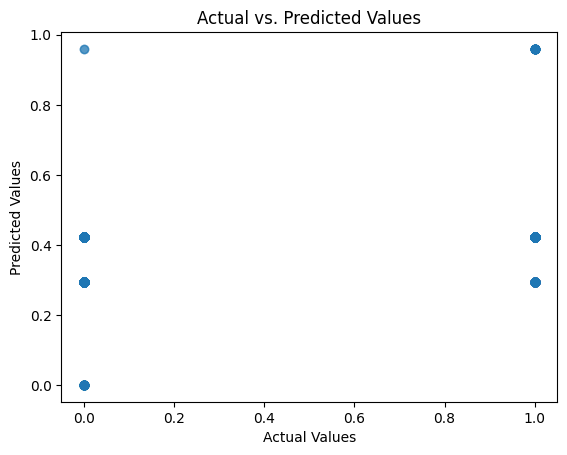

In [61]:
X = df[['Driver_ID', 'Age', 'City', 'Education_Level', 'Income',
        'Joining Designation', 'Grade',
        'Total Business Value', 'Joining_Year', 'Joining_quarter']]
y = df['LastWorkingDate']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

base_model = DecisionTreeRegressor(max_depth=3)
adaboost_regressor = AdaBoostRegressor(base_model, n_estimators=50, random_state=42)

adaboost_regressor.fit(X_train, y_train)

predictions = adaboost_regressor.predict(X_test)

mse = mean_squared_error(y_test, predictions)
r2 = r2_score(y_test, predictions)

print(f'Mean Squared Error (MSE): {mse}')
print(f'R-squared: {r2}')

plt.scatter(y_test, predictions, alpha=0.5)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs. Predicted Values')
plt.show()